# Opening a Fitness Center in New York City
### - Does it make sense?

A capstone project notebook for the IBM course "Applied Data Science Capstone" on coursera.org by Markus Jäckle

INDEX

<ul>
    <li><a href="#fn_[0]" name="[0]">Setup</a></li>
    <li><a href="#fn_[1]" name="[1]">Population Density per Borough</a></li>
    <li><a href="#fn_[2]" name="[2]">Data Preparation and Cleaning</a></li>
    <li><a href="#fn_[3]" name="[3]">Venue Density per Borough</a></li>
    <li><a href="#fn_[4]" name="[4]">Population- and Venue Density correlation?</a></li>
    <li><a href="#fn_[5]" name="[5]">Rating- and Likes correlation?</a></li>
    <li><a href="#fn_[6]" name="[6]">Rating- and Likes correlation!</a></li>
    <li><a href="#fn_[7]" name="[7]">Visualized weighed likes per venue</a></li>
    <li><a href="#fn_[8]" name="[8]">Clustered Fitness Centers</a></li>
    <li><a href="#fn_[9]" name="[9]">Preliminary Summary</a></li>
</ul>

<a href="#[0]" name="fn_[0]">Setup</a>

In [3]:
#installs:
!conda install -c conda-forge beautifulsoup4 --yes --quiet
!conda install -c conda-forge geopy --yes --quiet
!conda install -c conda-forge folium --yes --quiet
!conda install -c conda-forge phantomjs --yes --quiet
!conda install -c plotly plotly --yes --quiet 
!conda install -c plotly plotly-orca --yes --quiet 
!conda install -c conda-forge psutil --yes --quiet 
!conda install -c conda-forge requests --yes --quiet 
!conda install -c conda-forge selenium --yes --quiet
!conda install -c conda-forge shapely --yes --quiet

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.



In [133]:
#imports:
from bs4 import BeautifulSoup as bsoup
import folium
from folium import plugins as fp
from geopy.geocoders import Nominatim
from IPython.display import display
from IPython.display import HTML
from IPython.display import Image
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.io.json import json_normalize
import plotly
import pickle
import re
import requests
import seaborn as sns
import selenium
import selenium.webdriver
from shapely.geometry import shape, Point
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from time import sleep as pause
import types
print("Import complete.")

Import complete.


In [18]:
driver = selenium.webdriver.PhantomJS()
driver.set_window_size(800, 600)
#driver.get('mapname.html')
#driver.save_screenshot('screenshot.png')
#https://stackoverflow.com/questions/40208051/selenium-using-python-geckodriver-executable-needs-to-be-in-path
#https://github.com/mozilla/geckodriver/releases

In [134]:
# Cell containg the Foursquare Credentials and Version
CLIENT_ID = '#' # your Foursquare ID
CLIENT_SECRET = '#' # your Foursquare Secret
VERSION = '20200214' # Foursquare API version

In [135]:
pi = 3.14159265359

<a href="#[1]" name="fn_[1]">Population Density per Borough</a>

The five boroughs of New York City and their population density:

In [136]:
URL = 'https://en.wikipedia.org/wiki/New_York_City#Boroughs'
URL_HTML = requests.get(URL)
URL_HTML_SOUP = bsoup(URL_HTML.text, 'html.parser')
NYC_TABLE = URL_HTML_SOUP.find_all('table')[4]
NYC_TABLE_PANDAS = pd.DataFrame(pd.read_html(NYC_TABLE.prettify(), flavor='bs4')[0])
NYC_TABLE_PANDAS.columns = ['Borough','County','Population','GDP','GDP per capita','Area (sq.m.)','Area (sq.km.)','Density (p.p.sq.mi.)','Density (p.p.sq.km.)']
NYC_TABLE_PANDAS.drop([5,6,7],inplace=True)
NYC_TABLE_PANDAS.drop(columns=['County','Population','GDP','GDP per capita','Area (sq.km.)','Density (p.p.sq.km.)'],inplace=True)
NYC_TABLE_PANDAS.columns = ['Borough','Area','Population Density']
NYC_TABLE_PANDAS = NYC_TABLE_PANDAS.astype({"Population Density": int})
NYC_TABLE_PANDAS

,Borough,Area,Population Density
0,The Bronx,42.10,34653
1,Brooklyn,70.82,37137
2,Manhattan,22.83,72033
3,Queens,108.53,21460
4,Staten Island,58.37,8112


In [137]:
NYC_TABLE_PANDAS.sort_values(by='Borough', axis=0, inplace=True)
NYC_TABLE_PANDAS

,Borough,Area,Population Density
1,Brooklyn,70.82,37137
2,Manhattan,22.83,72033
3,Queens,108.53,21460
4,Staten Island,58.37,8112
0,The Bronx,42.10,34653


Querying the coordinates of New York City (for centering of the map) and of its boroughs, for requesting the fitness center venues via Foursquare.

In [138]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="New York City explored")
location = geolocator.geocode(address)
NYC_latitude = location.latitude
NYC_longitude = location.longitude

In [139]:
NYC_TABLE_PANDAS['Latitude'] = 0
NYC_TABLE_PANDAS['Longitude'] = 0

for i,row in NYC_TABLE_PANDAS.iterrows():
    address = row['Borough'] + ', New York City, NY'
    location = geolocator.geocode(address)
    NYC_TABLE_PANDAS.loc[i, 'Latitude'] = location.latitude
    NYC_TABLE_PANDAS.loc[i, 'Longitude'] = location.longitude

NYC_TABLE_PANDAS.reset_index(inplace=True)
NYC_TABLE_PANDAS.drop(columns='index',inplace=True)    

NYC_TABLE_PANDAS

,Borough,Area,Population Density,Latitude,Longitude
0,Brooklyn,70.82,37137,40.650104,-73.949582
1,Manhattan,22.83,72033,40.789624,-73.959894
2,Queens,108.53,21460,40.749824,-73.797634
3,Staten Island,58.37,8112,40.583456,-74.149605
4,The Bronx,42.10,34653,40.846651,-73.878594


In order to get an understanding of where the different boroughs are, an interactive map of New York city is generated.

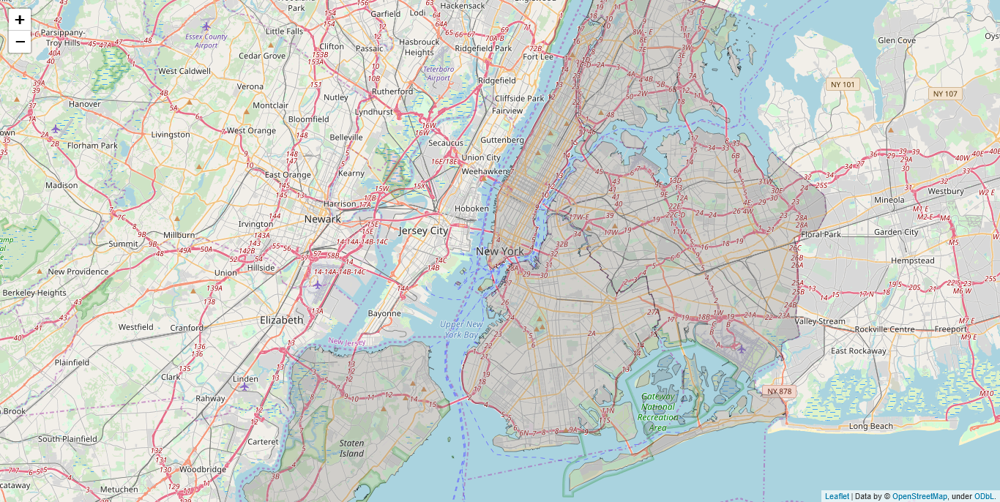

In [140]:
world_geo = r'Choropleth/boroughs.json'
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)

#The following code has been mainly taken from:
#https://nbviewer.jupyter.org/github/jtbaker/folium/blob/geojsonmarker/examples/GeoJsonMarkersandTooltips.ipynb

folium.Choropleth(
    geo_data=world_geo,
    fill_color='grey',
    fill_opacity=0.3,
    line_opacity=0.2,
    legend_name='Population density of NYC boroughs'
).add_to(world_map)

folium.GeoJson(data=world_geo,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

#display(world_map)

world_map_png_1 = world_map._to_png()

Image(world_map_png_1)

Please hover over the different boroughs to get their names.

Next, we will create a choropleth map of the population densities of the different boroughs.

To display information in form of a tooltip upon hovering above a certain borough, the desired data needs to be injected into the cached boroughs.json file, since the GeoJsonTooltip option of folium only allows for the displaying of information about the hovered borough, if that information is contained within the accessed geojson data file.

In this case, this means that we inject the information about the respective population densities into the world_geo_data object, which contains our geojson file:

In [141]:
Borough_PopDens_Dict = {}

for i, row in NYC_TABLE_PANDAS.iterrows():
    Borough_PopDens_Dict[row[0]] = row[2]

with open('Choropleth/boroughs.json') as world_geo_file:
    world_geo_data = json.load(world_geo_file)

for element in world_geo_data['features']:
    element['properties']['PopDens'] = "Population Density: " + str(Borough_PopDens_Dict[element['properties']['BoroName']])

Now, the choropleth map can actually be created:

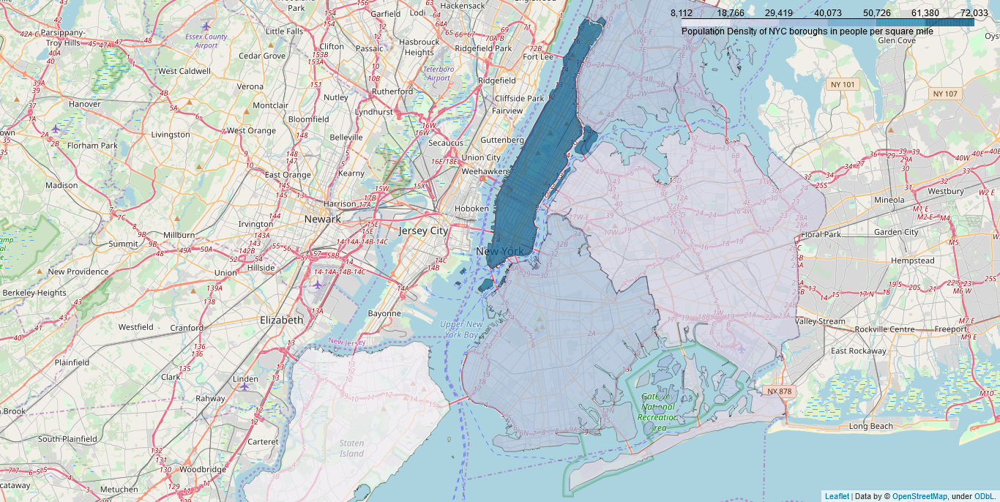

In [142]:
world_geo = r'Choropleth/boroughs.json'
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11, min_zoom=11, max_zoom=11, zoom_control=False)

folium.Choropleth(
    geo_data=world_geo_data,
    data=NYC_TABLE_PANDAS,
    columns=['Borough','Population Density'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population Density of NYC boroughs in people per square mile'
).add_to(world_map)

#folium.vector_layers.Rectangle(bounds=[[41.075,-74.411],[40.985,-73.2]],color='white',opacity=0.5,fill=True,fill_color='white',fill_opacity=0.8).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
                tooltip=folium.GeoJsonTooltip(fields=['BoroName','PopDens'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

#display(world_map)

world_map_png_2 = world_map._to_png()

Image(world_map_png_2)

<a href="#[2]" name="fn_[2]">Data Preparation and Cleaning</a>

Now, we will query the top 100 fitness locations for each borough:

In [143]:
radius = 6000
LIMIT = 100
q_category = '52f2ab2ebcbc57f1066b8b48,4bf58dd8d48988d176941735,590a0744340a5803fd8508c3'

In [310]:
q_results = pd.DataFrame(columns={'Name', 'Category', 'Latitude', 'Longitude', 'ID'})

for i, row in NYC_TABLE_PANDAS.iterrows():
    
    q_borough = row[0]
    q_lat = row[3]
    q_long = row[4]
    
    q_url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, q_lat, q_long, q_category, radius, LIMIT)

    #q_requests_results = requests.get(q_url).json()
    
    with open('Boroughs/' + q_borough + '.json', 'w') as file_out:
        file_out.write(str(q_requests_results))
    
    q_temp = json_normalize(q_requests_results['response']['groups'][0]['items'])
    
    q_temp = q_temp.loc[:,['venue.name','venue.categories','venue.location.lat','venue.location.lng','venue.id']]
    
    for i, row in q_temp.iterrows():
        q_temp.loc[i,'venue.categories'] = row['venue.categories'][0]['name']
    
    q_temp = q_temp.rename(columns={'venue.name':'Name', 'venue.categories':'Category', 'venue.location.lat':'Latitude', 'venue.location.lng':'Longitude', 'venue.id':'ID'})
    
    q_results = q_results.append(q_temp, sort=False)
    
    print('Borough: ' + q_borough)
    print('The query contained ' + str(len(q_temp)) + ' venues.')

q_results = q_results.reindex(['Name', 'Category', 'Latitude', 'Longitude', 'ID'], axis=1)    

q_results.to_csv('Boroughs/q_results.csv', index = None, header=True)

Borough: Brooklyn
The query contained 100 venues.
Borough: Manhattan
The query contained 100 venues.
Borough: Queens
The query contained 80 venues.
Borough: Staten Island
The query contained 47 venues.
Borough: The Bronx
The query contained 85 venues.


Remember, the above presented <a href="#fn_[queried_data]" name="[queried_data]">counted venues per borough</a> are only counted, as retrieved from the query. These counts have to be verified, and corrected, if necessary.

In [145]:
q_results

,Name,Category,Latitude,Longitude,ID
0,Blink Fitness,Gym,40.651901,-73.958828,51f9c38a498e0a7711ce2e28
1,Crunch Flatbush,Gym / Fitness Center,40.645798,-73.958149,58f51678826444025008d538
2,Tabata Ultimate Fitness,Gym,40.678852,-73.957216,5895dbd93bd4ab768a282289
3,Blink Fitness,Gym,40.669828,-73.931352,538ce459498ebe718bcc4339
4,iLoveKickboxing,Gym,40.666018,-73.989289,583d359d46563a02bea58238
...,...,...,...,...,...
407,Harlem CrossFit,Gym,40.817194,-73.935138,4f71aa93e4b00bcde29e9632
408,Hayden On Hudson Gym,Gym,40.889593,-73.917446,4ce716cd0f196dcb7fe43bae
409,The Grinnell Gym,Gym,40.834771,-73.945975,518c3c36498ed8cb9750053c
410,P90x Bootcamp,Gym,40.816337,-73.935574,4eae730177c8cdc66db9bede


The following box contains the import of the above-created pandas dataframes. It does not have to executed.

In [144]:
###q_results = pd.read_csv('Boroughs/q_results.csv')

Now, we check how many entries our dataframe consists of:

In [146]:
print(len(q_results))

412


Are they unique?

In [147]:
print(len(set(q_results['ID'])))

410


This means, that two entries have the same ID, and are thus duplicates of each other.

Let's remove these:

In [148]:
q_results.drop_duplicates(subset='ID',inplace=True)
print(len(q_results))
print(len(set(q_results['ID'])))

410
410


Let's visualize the results:

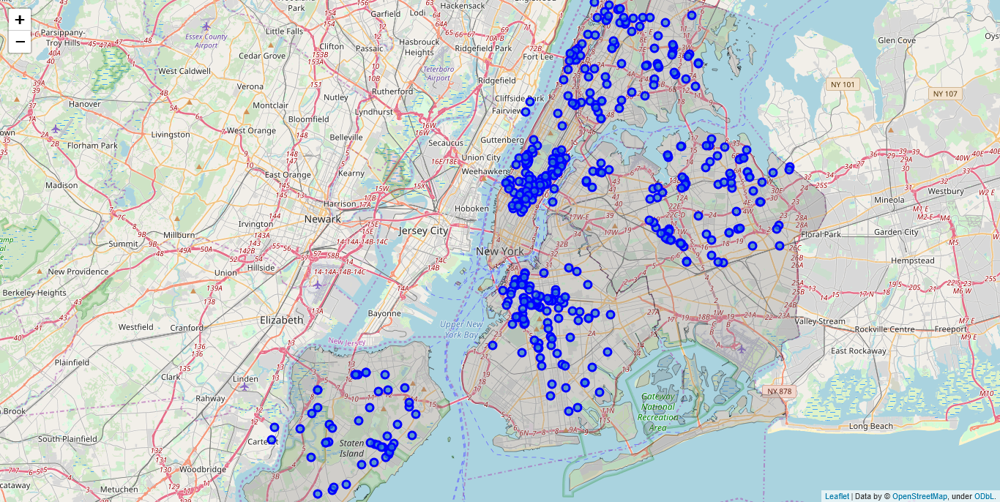

In [149]:
world_geo = r'Choropleth/boroughs.json'
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)


folium.Choropleth(
    geo_data=world_geo,
    fill_color='grey',
    fill_opacity=0.3,
    line_opacity=0.2,
    legend_name='Population density of NYC boroughs'
).add_to(world_map)

folium.GeoJson(data=world_geo,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

for lat, lng, name, category, idnum in zip(q_results['Latitude'], q_results['Longitude'], q_results['Name'], q_results['Category'], q_results['ID']):
    label = '{}, {}, {}'.format(name, category, idnum)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(world_map)  
    
#display(world_map)

world_map_png_3 = world_map._to_png()

Image(world_map_png_3)

Please note that the venues in the Queens borough, which clearly lie outside the query radius of the queens borough, will be removed from further processing, since they later on falsify the density of venues per square mile, if calculated based on the query radius:

In [150]:
q_results_corque = q_results.copy()

#Since there are only 9 boroughs in Queens, 
#which fall under the mentioned category, 
#a list of the boroughs, which need to be removed is created manually,
#using the generated map:

queens_venues_remove = ['51dcb1d2498e05253437a98f','4a843826f964a520f2fb1fe3','4bafcc2cf964a5208e213ce3','51e02b2d2fc6b6ed4b767ba5','4d7ce85486cfa14365a2d2a0','4c94d26d58d4b60c40fc2b29','5c3d34fc51950e002ce316b4','4b186023f964a520bbd123e3','529688b811d2e101fca0bf89']

counter_queens_remove = 0
counter = 0

bool_flag = False

for item in queens_venues_remove:
    
    bool_flag = (q_results_corque.loc[q_results_corque['ID'] == item]['ID'] == item).values[0]
    
    if bool_flag:
        q_results_corque.drop(q_results_corque.loc[q_results_corque['ID'] == item].index,inplace=True)
        counter_queens_remove += 1
    else:
       pass
    counter += 1

print(str(counter_queens_remove) + ' venues have been removed from the dataframe.')

9 venues have been removed from the dataframe.


In [151]:
q_results_corque.reset_index(inplace=True)
q_results_corque.drop(columns='index',inplace=True)
print(len(q_results_corque))

401


Also, let's associate the different venues with a neighborhood, if within a neighborood, and if not, let's remove them from the dataframe:

In [152]:
q_results_b = q_results_corque.copy()
q_results_b['Borough'] = 'Null'
q_results_b = q_results_b.reindex(['Name', 'Category', 'Borough', 'Latitude', 'Longitude', 'ID'], axis=1)    

In [153]:
#Parts of the following code have been taken from:
#http://archived.mhermans.net/geojson-shapely-geocoding.html

# load GeoJSON file containing sectors
with open ('Choropleth/boroughs.json', 'r') as f:
    boroughs_shapes = json.load(f)

counter_noborough = 0 
    
for i,row in q_results_b.iterrows():
    
    # construct point based on lat/long returned by geocoder
    # IMPORTANT: THE FORMAT HERE IS Point(LONGITUDE,LATITUDE)
    point = Point(row["Longitude"],row["Latitude"])
    
    # check each polygon to see if it contains the point

    counter = 0
    check = 0
    
    for feature in boroughs_shapes['features']:
        polygon = shape(feature['geometry'])
        if polygon.contains(point):
            q_results_b.loc[i,'Borough'] = feature['properties']['BoroName']
            check = 1
        elif check == 0 and counter == 4:
            #print('No corresponding borough found for ID ' + row['ID'] + ' !')
            q_results_b.drop([i],inplace=True)
            #print('Venue removed from dataframe.')
            counter_noborough += 1
        counter += 1

print(str(counter_noborough) + ' venues have been removed from the dataframe.')

5 venues have been removed from the dataframe.


Since 5 venues have been removed from the dataframe, the dataframe should consist of 401 - 5 venues, let's check that:

In [154]:
print(len(q_results_b))

396


Let's print a map with all venues again:

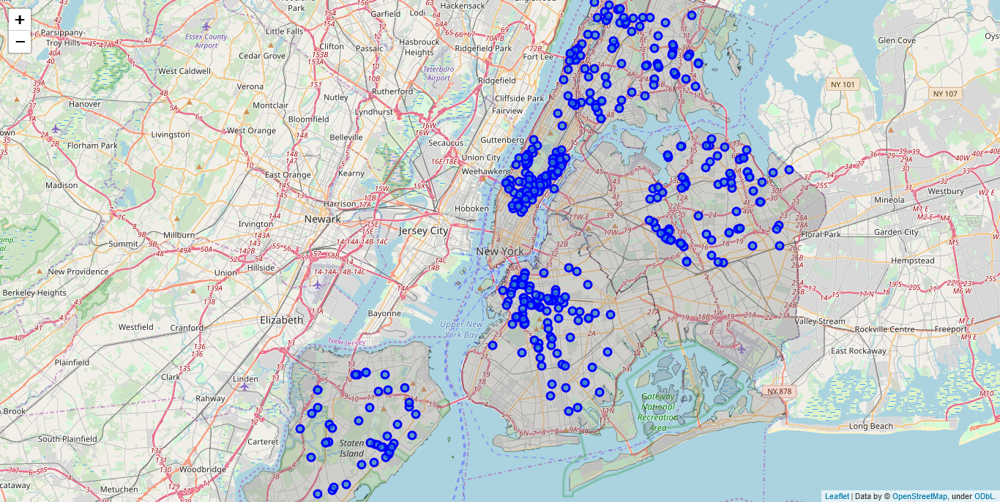

In [155]:
world_geo = r'Choropleth/boroughs.json'
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)


folium.Choropleth(
    geo_data=world_geo,
    fill_color='grey',
    fill_opacity=0.3,
    line_opacity=0.2,
    legend_name='Population density of NYC boroughs'
).add_to(world_map)

folium.GeoJson(data=world_geo,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

for lat, lng, name, category, idnum in zip(q_results_b['Latitude'], q_results_b['Longitude'], q_results_b['Name'], q_results_b['Category'], q_results_b['ID']):
    label = '{}, {}, {}'.format(name, category, idnum)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(world_map)  
    
#display(world_map)

world_map_png_4 = world_map._to_png()

Image(world_map_png_4)

The dataframe needs to be reindexed, since 5 rows have been removed:

In [156]:
q_results_b.reset_index(inplace=True)
q_results_b.drop(columns='index',inplace=True)

In [50]:
###q_results_b = pd.read_csv('Boroughs/q_results_b.csv')

In [157]:
venues = q_results_b.copy()

Now, let's group the venues by Borough and then count the venues per borough:

In [158]:
venues_count = venues.groupby('Borough').count()
venues_count.drop(columns=['Name','Category','Latitude','Longitude'],inplace=True)
venues_count['Count'] = venues_count['ID']
venues_count.drop(columns='ID',inplace=True)
venues_count

,Count
Borough,
Brooklyn,100
Manhattan,105
Queens,79
Staten Island,45
The Bronx,67


We have removed two duplicates, five venues with no assigned borough, and reassigned certain venues to different boroughs.

After this data cleaning and correction process, <a href="#[queried_data]" name="fn_[queried_data]">contrary to the original counts</a>, where 'The Bronx' contained 85 venues, only 67 venues are left. The reason can be found in the shape of Manhattan. Manhattan is a very long-stretched borough, and a long part of it extends into the query radius of 'The Bronx' on its borders.

<a href="#[3]" name="fn_[3]">Venue Density per Borough</a>

In the next step, the venues per area per borough are counted.

Please note, since the query consisted of a radius of 6000 meters, the area will be calculated based on a circle with that radius, and not with the official borough area.

!!! Please also note, that, within in the scope of this work, and with a free personal Foursquare account, the number of venues per query was restricted to 100 venues. !!!

In [159]:
radius = 6000

A_q_sqme = 2 * pi * radius**2
A_q_sqkm = A_q_sqme / 1000000

#Query-area in square miles:
A_q_sqmi = A_q_sqkm * 0.386102

In [160]:
venues_count['Venue Density'] = 0

for i,row in venues_count.iterrows():
    venues_count.loc[i,'Venue Density'] = row['Count'] / A_q_sqmi

In [161]:
venues_count.reset_index(inplace=True)
venues_count

,Borough,Count,Venue Density
0,Brooklyn,100,1.145027
1,Manhattan,105,1.202278
2,Queens,79,0.904571
3,Staten Island,45,0.515262
4,The Bronx,67,0.767168


In [162]:
Borough_VenDens_Dict = {}

for i, row in venues_count.iterrows():
    Borough_VenDens_Dict[row[0]] = row[2]

with open('Choropleth/boroughs.json') as world_geo_file:
    world_geo_data = json.load(world_geo_file)

for element in world_geo_data['features']:
    element['properties']['VenDens'] = "Venue Density: " + '{0:.3}'.format(Borough_VenDens_Dict[element['properties']['BoroName']])

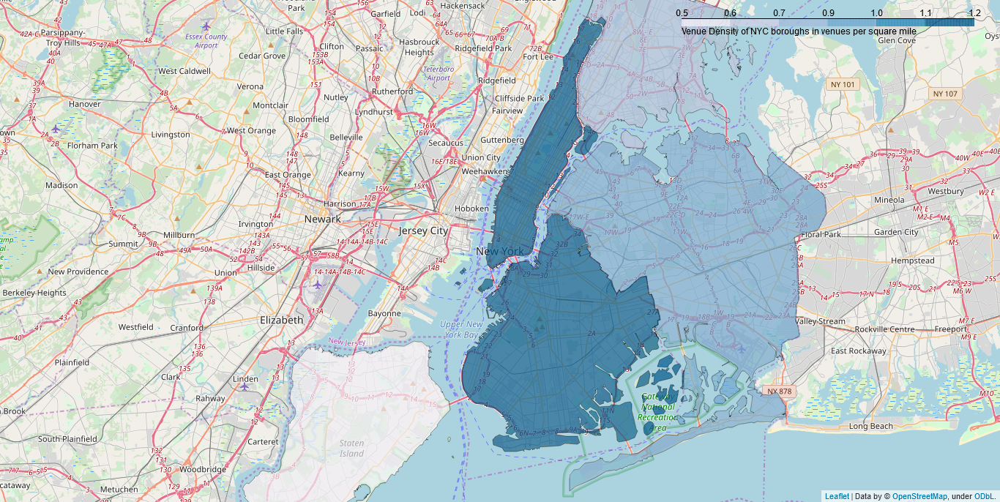

In [163]:
world_geo = r'Choropleth/boroughs.json'
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11, min_zoom=11, max_zoom=11, zoom_control=False)

folium.Choropleth(
    geo_data=world_geo_data,
    data=venues_count,
    columns=['Borough','Venue Density'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Venue Density of NYC boroughs in venues per square mile'
).add_to(world_map)

#folium.vector_layers.Rectangle(bounds=[[41.075,-74.411],[40.985,-73.2]],color='white',opacity=0.5,fill=True,fill_color='white',fill_opacity=0.8).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
                tooltip=folium.GeoJsonTooltip(fields=['BoroName','VenDens'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

#display(world_map)

world_map_png_5 = world_map._to_png()

Image(world_map_png_5)

<a href="#[4]" name="fn_[4]">Population- and Venue Density correlation?</a>

While some boroughs suggest a correlation between population density and venue density, which would make sense, some boroughs counter this trend.

Let's try to verify such a correlation, or show for which borouhgs it holds true, we normalize our data using feature scaling

$x_{new} = \frac{x - x_{min}}{x_{max}-x_{min}}$

and create a regression plot.

In [164]:
popdens_vendens_dataframe = pd.DataFrame()

max_popdens = NYC_TABLE_PANDAS['Population Density'].max()
min_popdens = NYC_TABLE_PANDAS['Population Density'].min()
max_vendens = venues_count['Venue Density'].max()
min_vendens = venues_count['Venue Density'].min()

popdens_vendens_dataframe['Borough'] = NYC_TABLE_PANDAS['Borough']
popdens_vendens_dataframe['Population Density'] = (NYC_TABLE_PANDAS['Population Density']-min_popdens)/(max_popdens-min_popdens)
popdens_vendens_dataframe['Venue Density'] = (venues_count['Venue Density']-min_vendens)/(max_vendens-min_vendens)

popdens_vendens_dataframe

,Borough,Population Density,Venue Density
0,Brooklyn,0.454076,0.916667
1,Manhattan,1.000000,1.000000
2,Queens,0.208820,0.566667
3,Staten Island,0.000000,0.000000
4,The Bronx,0.415216,0.366667


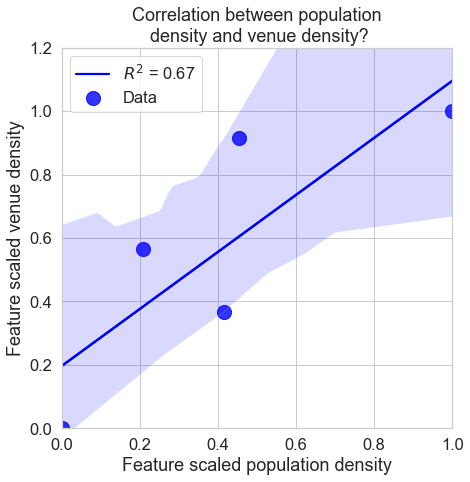

In [165]:
linear_regression = LinearRegression()
X = popdens_vendens_dataframe[['Population Density']]
Y = popdens_vendens_dataframe[['Venue Density']]

linear_regression.fit(X,Y)

#adjusted = 1 - (1-linear_regression.score(X,Y))*(len(Y)-1)/(len(Y)-X.shape[1]-1)
#print(adjusted)

plt.figure(figsize=(7,7))

sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='Population Density', y='Venue Density', data=popdens_vendens_dataframe, color='blue', marker='o', scatter_kws={'s': 200}, ci=None, label='Data')
ax = sns.regplot(x='Population Density', y='Venue Density', data=popdens_vendens_dataframe, color='blue', marker='o', scatter_kws={'s': 200}, scatter=False, label='$R^2$ = ' + '{0:.4}'.format(str(linear_regression.score(X,Y))))

ax.set(xlabel='Feature scaled population density', ylabel='Feature scaled venue density')
ax.set_title('Correlation between population\n density and venue density?')

plt.xlim((0,1))
plt.ylim((0,1.2))

plt.legend()

As can be seen, some correlation seems to be present, however, not enough data points are measured to verify this trends, also quite some outliers, with factors of ~2 (Brooklyn) to ~3 (Queens) are present.

Also, the coefficient of determination $R^2$ seems to small, in order to speak of a direct correlation.

Both, the lack of data points and the small coefficient of determination are reflected in the blue-shaded confidence interval for the regression estimate.

To get a measure for venues per population, generally, it would be enough to divide the total amount of venues by the population. However, due to restrictions of the foursquare api free accounts, such a query is barely possible since the output of a query is restricted to 100 venues.

Therefore, the venues per area will be divided by the population per area, which in our case should give a good estimate of venues per population:

In [166]:
#vpd = venues per population dataframe

vpd = pd.DataFrame()

popdens = NYC_TABLE_PANDAS['Population Density']
vendens = venues_count['Venue Density']

vpd['Borough'] = NYC_TABLE_PANDAS['Borough']
vpd['Venues per Population'] = vendens/popdens

vpd_sorted = vpd.sort_values(by='Venues per Population', ascending=False)

vpd_sorted

,Borough,Venues per Population
3,Staten Island,0.000064
2,Queens,0.000042
0,Brooklyn,0.000031
4,The Bronx,0.000022
1,Manhattan,0.000017


Thus, according to the queried data, Staten Island has the highest venues per people, even though it has the lowest venue density and population density.

Even though having the highest population density, Manhattan has the lowest venues per population, according to the queried data.

Please note that these results have to be treated with caution, since the query for Brooklyn and Manhattan was caped at 100 venues, possibly, the query would have returned more venues.

Now, the ratings and likes of each venue will be queried:

In [62]:
# To prevent false spam-positives, we will introduce a wait time of 1 second in to the loop:

attributes_dict = {}
likes_dict = {}
popular_dict = {}
price_dict = {}
rating_dict = {}
ratingSignals_dict = {}

for i, row in venues.iterrows():
    vID = row["ID"]
    vIDurl = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(vID, CLIENT_ID, CLIENT_SECRET, VERSION)
    #To prevent unintended code execution, I have commented the next line out.
    #vIDq = requests.get(vIDurl).json()
    vIDn = json_normalize(vIDq)
    try:
        attributes_dict[vID]= vIDn.loc[0,'response.venue.attributes.groups']
    except KeyError:
        print('No attributes present.')
    try:
        likes_dict[vID]= vIDn.loc[0,'response.venue.likes.count']
    except KeyError:
        print('No likes count present.')
    try:
        popular_dict[vID]= vIDn.loc[0,'response.venue.popular.timeframes']
    except KeyError:
        print('No popular timeframes present.')
    try:
        price_dict[vID]= vIDn.loc[0,'response.venue.price']
    except KeyError:
        print('No pricing tiers present.')
    try:
        rating_dict[vID]= vIDn.loc[0,'response.venue.rating']
    except KeyError:
        print('No ratings present.')
    try:
        ratingSignals_dict[vID]= vIDn.loc[0,'response.venue.ratingSignals']
    except KeyError:
        print('No rating signals count present.')
    # Pause of 2 seconds between two requests/queries.
    pause(2)

NameError: name 'CLIENT_ID' is not defined

In [463]:
# Save
###np.save('Venues/attributes_dict.npy', attributes_dict) 
###np.save('Venues/likes_dict.npy', likes_dict) 
###np.save('Venues/popular_dict.npy', popular_dict) 
###np.save('Venues/price_dict.npy', price_dict) 
###np.save('Venues/rating_dict.npy', rating_dict) 
###np.save('Venues/ratingSignals_dict.npy', ratingSignals_dict)

In [167]:
# Load
attributes_dict = np.load('Venues/attributes_dict.npy',allow_pickle='TRUE').item()
likes_dict = np.load('Venues/likes_dict.npy',allow_pickle='TRUE').item()
popular_dict = np.load('Venues/popular_dict.npy',allow_pickle='TRUE').item()
price_dict = np.load('Venues/price_dict.npy',allow_pickle='TRUE').item()
rating_dict = np.load('Venues/rating_dict.npy',allow_pickle='TRUE').item()
ratingSignals_dict = np.load('Venues/ratingSignals_dict.npy',allow_pickle='TRUE').item()

In [168]:
print('The number of venues is : ' + str(len(venues)))
print('The number of venues with attributes is : ' + str(len(attributes_dict)))
print('The number of venues with likes is : ' + str(len(likes_dict)))
print('The number of venues with popular hours is : ' + str(len(popular_dict)))
print('The number of venues with price tiers is : ' + str(len(price_dict)))
print('The number of venues with ratings is : ' + str(len(rating_dict)))
print('The number of venues with rating signals is : ' + str(len(ratingSignals_dict)))

The number of venues is : 396
The number of venues with attributes is : 396
The number of venues with likes is : 396
The number of venues with popular hours is : 235
The number of venues with price tiers is : 0
The number of venues with ratings is : 221
The number of venues with rating signals is : 221


<a href="#[5]" name="fn_[5]">Rating- and Likes correlation?</a>

At first glance it would seem that the number of likes is a very good descriptor for the popularity of a location, especially since all locations have likes, however this might not be the case.

Theoretically, a good descriptor should include the ratio between likes and dislikes.

It would be of benefit if we could use the number of likes, since they are available for all locations, but first let's check if there is a correlation between likes and ratings, for the 221 locations that have both.

If there is a correlation, then we can use number of likes as an indicator for popularity, otherwise we need to use the ratings.

In [169]:
#vwr = venues_with_ratings
vwr = []

venue = ''
for venue in rating_dict:
    vwr.append(venue)

#lwr = likes_with_rating_dict
lwr = {}

venue = ''
for venue in likes_dict:
    if venue in vwr:
        lwr[venue] = likes_dict[venue]
    else:
        pass

In [170]:
print('The number of venues in the ratings dictionary is: ' + str(len(rating_dict)))
print('The number of venues in the likes with rating dictionary is: ' + str(len(lwr)))

The number of venues in the ratings dictionary is: 221
The number of venues in the likes with rating dictionary is: 221


Let's create a dataframe from both dictionaries:

In [171]:
rating_df = pd.DataFrame.from_dict(rating_dict, orient='index').reset_index()
rating_df.columns=['ID','Rating']
ratingSignals_df = pd.DataFrame.from_dict(ratingSignals_dict, orient='index').reset_index()
ratingSignals_df.columns=['ID','Rating Signals']
lwr_0_1 = pd.DataFrame.from_dict(lwr, orient='index').reset_index()
lwr_0_1.columns=['ID','Likes']

In [172]:
rating_likes = rating_df.merge(ratingSignals_df, on='ID').merge(lwr_0_1, on='ID')

Now, let's check for a correlation:

In [173]:
# fs = feature scaled normalization
rating_likes_fs = pd.DataFrame()

max_rating = rating_likes['Rating'].max()
min_rating = rating_likes['Rating'].min()
max_likes = rating_likes['Likes'].max()
min_likes = rating_likes['Likes'].min()

rating_likes_fs['ID'] = rating_likes['ID']
rating_likes_fs['Rating'] = (rating_likes['Rating']-min_rating)/(max_rating-min_rating)
rating_likes_fs['Likes'] = (rating_likes['Likes']-min_likes)/(max_likes-min_likes)

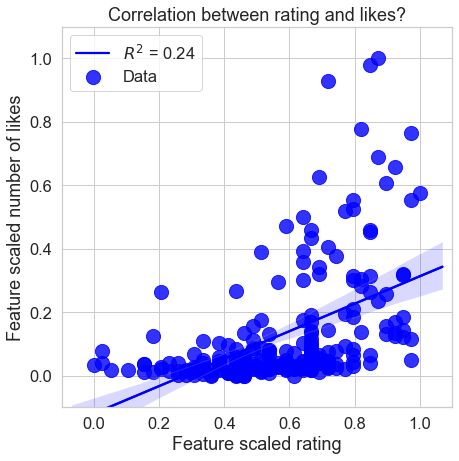

In [174]:
linear_regression = LinearRegression()
X = rating_likes_fs[['Rating']]
Y = rating_likes_fs[['Likes']]

linear_regression.fit(X,Y)

#adjusted = 1 - (1-linear_regression.score(X,Y))*(len(Y)-1)/(len(Y)-X.shape[1]-1)
#print(adjusted)

plt.figure(figsize=(7,7))

sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='Rating', y='Likes', data=rating_likes_fs, color='blue', marker='o', scatter_kws={'s': 200}, ci=None, label='Data')
ax = sns.regplot(x='Rating', y='Likes', data=rating_likes_fs, color='blue', marker='o', scatter_kws={'s': 200}, scatter=False, label='$R^2$ = ' + '{0:.4}'.format(str(linear_regression.score(X,Y))))

ax.set(xlabel='Feature scaled rating', ylabel='Feature scaled number of likes')
ax.set_title('Correlation between rating and likes?')

plt.xlim((-0.1,1.1))
plt.ylim((-0.1,1.1))

plt.legend()

<a href="#[6]" name="fn_[6]">Rating- and Likes correlation!</a>

The plot indicates, that there is no correlation between the two properties.

However, a like is an expression of a good rating.

Thus, it would make sense that the number of ratings times the rating divided by 10 correlates with the number of likes, thus let's implement the number of rating signals via:

$x = ratingSignals_{weighed} = ratingSignals * \frac{rating}{10}$

$y = likes$

In [175]:
for i,row in rating_likes.iterrows():
    rating_likes.loc[i,'Rating Signals weighed'] = row['Rating Signals'] * row['Rating'] / 10

rating_likes = rating_likes.reindex(['ID', 'Rating', 'Rating Signals', 'Rating Signals weighed', 'Likes'], axis=1)

rating_likes

,ID,Rating,Rating Signals,Rating Signals weighed,Likes
0,51f9c38a498e0a7711ce2e28,8.6,95,81.70,76
1,58f51678826444025008d538,8.5,18,15.30,14
2,5895dbd93bd4ab768a282289,8.7,13,11.31,12
3,538ce459498ebe718bcc4339,8.2,67,54.94,53
4,583d359d46563a02bea58238,8.9,75,66.75,16
...,...,...,...,...,...
216,4c2156c97e85c9282f66ba21,6.8,14,9.52,8
217,4cf19de26195721e9bc442c1,6.2,9,5.58,5
218,4c518ceb9426c9283e19f373,6.0,13,7.80,7
219,4a981282f964a520612a20e3,6.4,189,120.96,103


It can be clearly seen that in most cases, there is a correlation. Let's verify this:

In [176]:
# fs = feature scaled normalization
rating_likes_fs = pd.DataFrame()

max_rating = rating_likes['Rating Signals weighed'].max()
min_rating = rating_likes['Rating Signals weighed'].min()
max_likes = rating_likes['Likes'].max()
min_likes = rating_likes['Likes'].min()

rating_likes_fs['ID'] = rating_likes['ID']
rating_likes_fs['Rating Signals weighed'] = (rating_likes['Rating Signals weighed']-min_rating)/(max_rating-min_rating)
rating_likes_fs['Likes'] = (rating_likes['Likes']-min_likes)/(max_likes-min_likes)

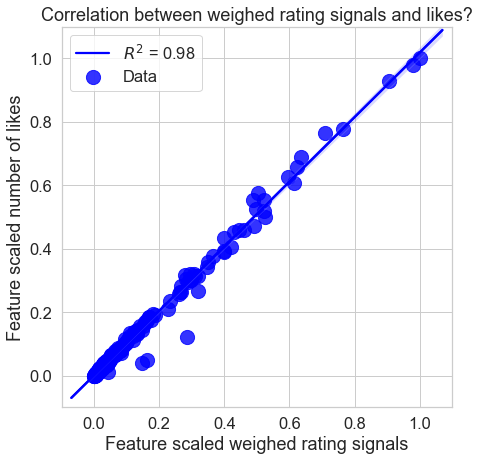

In [177]:
linear_regression = LinearRegression()
X = rating_likes_fs[['Rating Signals weighed']]
Y = rating_likes_fs[['Likes']]

linear_regression.fit(X,Y)

#adjusted = 1 - (1-linear_regression.score(X,Y))*(len(Y)-1)/(len(Y)-X.shape[1]-1)
#print(adjusted)

plt.figure(figsize=(7,7))

sns.set(font_scale=1.5)
sns.set_style('whitegrid')

ax = sns.regplot(x='Rating Signals weighed', y='Likes', data=rating_likes_fs, color='blue', marker='o', scatter_kws={'s': 200}, ci=None, label='Data')
ax = sns.regplot(x='Rating Signals weighed', y='Likes', data=rating_likes_fs, color='blue', marker='o', scatter_kws={'s': 200}, scatter=False, label='$R^2$ = ' + '{0:.4}'.format(str(linear_regression.score(X,Y))))

ax.set(xlabel='Feature scaled weighed rating signals', ylabel='Feature scaled number of likes')
ax.set_title('Correlation between weighed rating signals and likes?')

plt.xlim((-0.1,1.1))
plt.ylim((-0.1,1.1))

plt.legend()

Perfect, we found a really good correlation between the weighed rating $rating_{weighed}$ and the number of likes!

This means that we can use the likes as a substitute for the weighed rating, and since all ratings can be weighed, as a substitute for rating measure aswell.

Thus, the number of likes is indeed a descriptor for the popularity of a venue.

<a href="#[7]" name="fn_[7]">Visualized weighed likes per venue</a>

Now, let's visualize color-coded venue locations, based on the number of their weighed likes:

$likes_{weighed} = \frac{likes}{venues~*~populationDensity}$


In [178]:
likes_df = pd.DataFrame.from_dict(likes_dict, orient='index').reset_index()
likes_df.columns = ['ID','Likes']
venues = venues.merge(likes_df, on='ID')

In [179]:
Borough_PopDens_Dict

{'Brooklyn': 37137,
 'Manhattan': 72033,
 'Queens': 21460,
 'Staten Island': 8112,
 'The Bronx': 34653}

In [180]:
venues_count_reindexed = venues_count.copy().set_index('Borough')

In [181]:
Borough_Likes_dict = {'Brooklyn':0,'Manhattan':0,'Queens':0,'Staten Island':0,'The Bronx':0}

for i,row in venues.iterrows():
    Borough_Likes_dict[row['Borough']] += row['Likes']
            
#Likes per venue weighed by population density

BLW = {}

for b in Borough_Likes_dict:
    BLW[b] = Borough_Likes_dict[b] / (venues_count_reindexed.loc[b,'Count'] * Borough_PopDens_Dict[b])
    
BLW_df = pd.DataFrame.from_dict(BLW, orient='index').reset_index()
BLW_df.columns=['Borough','Weighed Likes']

Let's create a choropleth map, based on the weighed likes:

In [182]:
with open('Choropleth/boroughs.json') as world_geo_file:
    world_geo_data = json.load(world_geo_file)

for element in world_geo_data['features']:
    element['properties']['Likes weighed'] = "Weighed Likes: " + '{0:.3E}'.format(BLW[element['properties']['BoroName']])

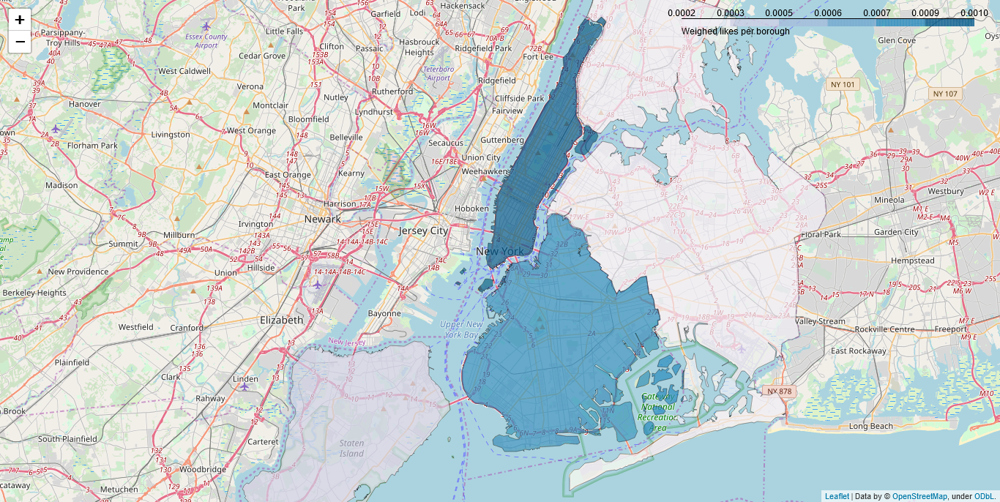

In [183]:
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)

folium.Choropleth(
    geo_data=world_geo_data,
    data=BLW_df,
    columns=['Borough','Weighed Likes'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Weighed likes per borough'
).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName','Likes weighed'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)

#display(world_map)

world_map_png_6 = world_map._to_png()

Image(world_map_png_6)

Now, let's color the different venues based on their likes value:

In [184]:
print('The maximum likes were ' + str(venues['Likes'].max()) + ', the minimum likes were ' + str(venues['Likes'].min()) + '.')

The maximum likes were 393, the minimum likes were 0.


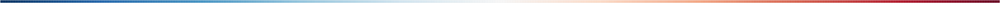

In [185]:
#For a documentation on seaborn color palettes, please visit:
#https://seaborn.pydata.org/tutorial/color_palettes.html

likes_range = venues['Likes'].max() + 1 - venues['Likes'].min()

likes_palette = sns.color_palette("RdBu_r", likes_range)
sns.palplot(sns.color_palette("RdBu_r", likes_range))

Since folium by default doesn't support color palettes this large, we will use the BeautifyIcon plugin and convert the color palettes generated by seaborn first to the simple rgb format and then to the hex format:

In [186]:
#https://www.codespeedy.com/convert-rgb-to-hex-color-code-in-python/
def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb

cc = 0

for color in likes_palette:
    likes_palette[cc] = list(likes_palette[cc])
    likes_palette[cc][0] = int(likes_palette[cc][0]*255)
    likes_palette[cc][1] = int(likes_palette[cc][1]*255)
    likes_palette[cc][2] = int(likes_palette[cc][2]*255)
    likes_palette[cc] = tuple(likes_palette[cc])
    likes_palette[cc] = rgb_to_hex(likes_palette[cc])
    likes_palette[cc] = '#' + str(likes_palette[cc])
    cc += 1

In [187]:
len(likes_palette)

394

In [188]:
#For a tutorial on implementing seaborn colorpalettes in folium,
#please refer to:
#https://openrouteservice.org/disaster-optimization/
#https://stackoverflow.com/questions/60131314/folium-draw-star-marker
#https://python-visualization.github.io/folium/plugins.html#folium.plugins.BeautifyIcon
#https://github.com/python-visualization/folium/blob/master/folium/plugins/beautify_icon.py
#https://github.com/marslan390/BeautifyMarker/blob/master/README.md

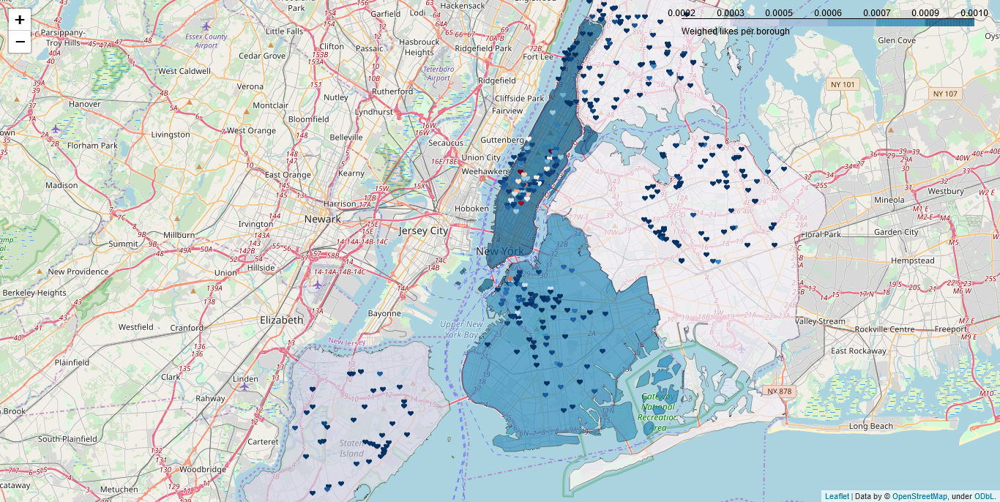

In [189]:
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)

folium.Choropleth(
    geo_data=world_geo_data,
    data=BLW_df,
    columns=['Borough','Weighed Likes'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Weighed likes per borough'
).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName','Likes weighed'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)


for lat, lng, name, category, likes in zip(venues['Latitude'], venues['Longitude'], venues['Name'], venues['Category'], venues['Likes']):
    label = 'Name: {}, Category: {}, Likes: {}'.format(name, category, likes)
    label = folium.Tooltip(label)
    icon = folium.Icon(color='white',colorOpacity=0.5,icon_color='black',icon='heart', prefix='fa', angle=0)
    folium.Marker(
        [lat, lng],
        tooltip=label,
        icon=fp.BeautifyIcon(
            icon='heart',
            #iconShape='circle',
            iconSize=[0,0],
            borderWidth=0,
            text_color=likes_palette[likes],
            #background_color=likes_palette[likes],
            inner_icon_style="font-size:8px;"
        )
    ).add_to(world_map)  



#display(world_map)

world_map_png_7 = world_map._to_png()

Image(world_map_png_7)

Since the likes of the lower populated boroughs can't be distinguished well enough, let's visualize the likes per normalized population density:

In [190]:
NYC_TABLE_PANDAS_reindexed = NYC_TABLE_PANDAS.copy().set_index('Borough')

venue_weighed_likes_fs = {}

# fs = feature scaled normalization
venue_weighed_likes_fs = pd.DataFrame()

max_vlikes = venues['Likes'].max()
min_vlikes = venues['Likes'].min()

venue_weighed_likes_fs['Likes'] = venues['Likes']
venue_weighed_likes_fs['Borough'] = venues['Borough']
venue_weighed_likes_fs['ID'] = venues['ID']

venue_weighed_likes_fs = venue_weighed_likes_fs.copy()

for i,row in venues.iterrows():
    venue_weighed_likes_fs.loc[i,'vwl'] = venue_weighed_likes_fs.loc[i,'Likes'] / NYC_TABLE_PANDAS_reindexed.loc[venue_weighed_likes_fs.loc[i,'Borough'],'Population Density']

# Now we feature sclae the weighed likes:
venue_weighed_likes_fs['vwl'] = (venue_weighed_likes_fs['vwl'] - venue_weighed_likes_fs['vwl'].min())/(venue_weighed_likes_fs['vwl'].max()-venue_weighed_likes_fs['vwl'].min())
venue_weighed_likes_fs_color = venue_weighed_likes_fs.copy()
venue_weighed_likes_fs_color['vwl'] = venue_weighed_likes_fs_color['vwl']*1000/2
venue_weighed_likes_fs_color = venue_weighed_likes_fs_color.astype({'vwl':int})
#venue_weighed_likes_fs_color.drop_duplicates(inplace=True)
#venue_weighed_likes_fs_color.sort_values(by='Likes',inplace=True)
venue_weighed_likes_fs_color = venue_weighed_likes_fs_color.set_index('ID')
print(venue_weighed_likes_fs_color['vwl'].max())

500


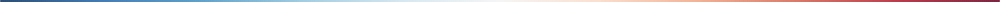

In [191]:
#For a documentation on seaborn color palettes, please visit:
#https://seaborn.pydata.org/tutorial/color_palettes.html

likes_range_w = venue_weighed_likes_fs_color['vwl'].max() + 1

likes_palette_w = sns.color_palette("RdBu_r", likes_range_w)
sns.palplot(sns.color_palette("RdBu_r", likes_range_w))

In [192]:
#https://www.codespeedy.com/convert-rgb-to-hex-color-code-in-python/
def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb

cc = 0

for color in likes_palette_w:
    likes_palette_w[cc] = list(likes_palette_w[cc])
    likes_palette_w[cc][0] = int(likes_palette_w[cc][0]*255)
    likes_palette_w[cc][1] = int(likes_palette_w[cc][1]*255)
    likes_palette_w[cc][2] = int(likes_palette_w[cc][2]*255)
    likes_palette_w[cc] = tuple(likes_palette_w[cc])
    likes_palette_w[cc] = rgb_to_hex(likes_palette_w[cc])
    likes_palette_w[cc] = '#' + str(likes_palette_w[cc])
    cc += 1

In [193]:
weighed_color_dict = {}

for i,row in venue_weighed_likes_fs_color.iterrows():
    weighed_color_dict[row['vwl']] = likes_palette_w[row['vwl']]

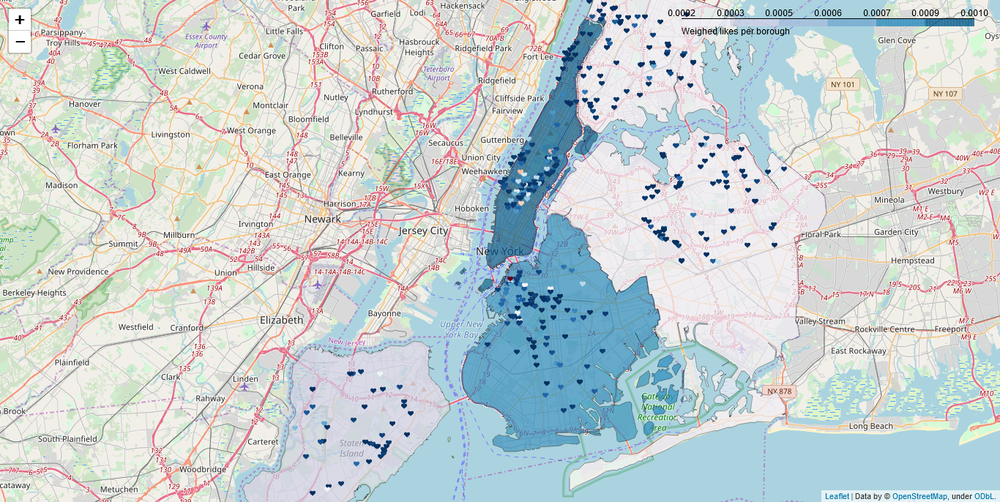

In [194]:
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)

folium.Choropleth(
    geo_data=world_geo_data,
    data=BLW_df,
    columns=['Borough','Weighed Likes'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Weighed likes per borough'
).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName','Likes weighed'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)


for lat, lng, name, category, likes, idnum in zip(venues['Latitude'], venues['Longitude'], venues['Name'], venues['Category'], venues['Likes'], venues['ID']):
    label = 'Name: {}, Category: {}, Likes: {}'.format(name, category, likes)
    label = folium.Tooltip(label)
    icon = folium.Icon(color='white',colorOpacity=0.5,icon_color='black',icon='heart', prefix='fa', angle=0)
    folium.Marker(
        [lat, lng],
        tooltip=label,
        icon=fp.BeautifyIcon(
            icon='heart',
            #iconShape='circle',
            iconSize=[0,0],
            borderWidth=0,
            text_color=weighed_color_dict[venue_weighed_likes_fs_color.loc[idnum,'vwl']],
            #background_color=likes_palette[likes],
            inner_icon_style="font-size:8px;"
        )
    ).add_to(world_map)  



#display(world_map)

world_map_png_8 = world_map._to_png()

Image(world_map_png_8)

Note that the top location no longer is in Manhattan, but in Brooklyn. Let's look it up:

In [195]:
print('ID of max value entry: ' + venue_weighed_likes_fs_color['vwl'].idxmax())
venues.loc[venues['ID'] == '49da5ee0f964a5207c5e1fe3']

ID of max value entry: 49da5ee0f964a5207c5e1fe3


,Name,Category,Borough,Latitude,Longitude,ID,Likes
30,Equinox Brooklyn Heights,Gym,Brooklyn,40.69253,-73.991587,49da5ee0f964a5207c5e1fe3,305


Let's visualize the weighed likes using a boxplot:

In [196]:
venue_weighed_likes_fs_norm = venue_weighed_likes_fs.copy()

#To mimic the original likes, the venues are multiplied with the original
#maximum value for the likes, however, of course the values now change,
#since they are now weighed by the population density:
venue_weighed_likes_fs_norm['vwl'] = venue_weighed_likes_fs_norm['vwl'] * venues['Likes'].max()

In [197]:
venue_weighed_likes_fs_norm.describe()

,Likes,vwl
count,396.000000,396.000000
mean,28.886364,28.628012
std,60.536962,51.575477
min,0.000000,0.000000
25%,0.000000,0.000000
50%,5.000000,7.105904
75%,22.250000,30.224690
max,393.000000,393.000000


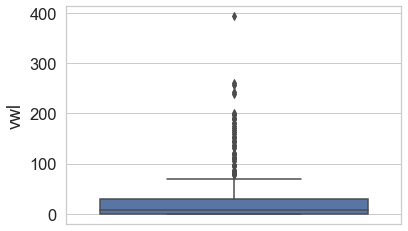

In [198]:
sns.boxplot(y=venue_weighed_likes_fs_norm['vwl'], data=venue_weighed_likes_fs_norm)

As expected, most venues do not get above the upper quartile of 30 weighed likes, however, some venues get far above that value.

<a href="#[8]" name="fn_[8]">Clustered Fitness Centers</a>

Now, while the above map looks nice, the information contained in it can be better visualized using the skmeans clustering method:

In [199]:
venue_weighed_likes_fs_norm_coord = venue_weighed_likes_fs_norm.copy()

vwl_max = venue_weighed_likes_fs_norm['vwl'].max()
vwl_min = venue_weighed_likes_fs_norm['vwl'].min()

for i,row in venue_weighed_likes_fs_norm.iterrows():
    venue_weighed_likes_fs_norm_coord.loc[i,'vwl'] = (venue_weighed_likes_fs_norm.loc[i,'vwl'] - vwl_min) / (vwl_max - vwl_min)
    venue_weighed_likes_fs_norm_coord.loc[i,'Latitude'] = (venues.loc[i,'Latitude'] - venues['Latitude'].min()) / (venues['Latitude'].max() - venues['Latitude'].min())
    venue_weighed_likes_fs_norm_coord.loc[i,'Longitude'] = (venues.loc[i,'Longitude'] - venues['Longitude'].min()) / (venues['Longitude'].max() - venues['Longitude'].min())

Because the weighed likes contain quite some important outliers, we will not use the feature scaling normalization, but rather standardization for scaling:

In [200]:
venue_weighed_likes_skmean = venue_weighed_likes_fs_norm_coord[['vwl','Latitude','Longitude']].copy()
vwls = StandardScaler().fit_transform(venue_weighed_likes_skmean)

In [201]:
nclusters = 20

kmeans_s = KMeans(n_clusters=nclusters, init="k-means++", n_init=100).fit(vwls)

# check cluster labels generated for each row in the dataframe
vwls_labels = kmeans_s.labels_

In [202]:
#venues.drop('Cluster label', axis=1, inplace=True)

In [203]:
venues.insert(0, 'Cluster label', vwls_labels)

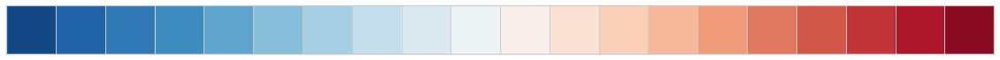

In [204]:
#For a documentation on seaborn color palettes, please visit:
#https://seaborn.pydata.org/tutorial/color_palettes.html

vwls_colors_range = nclusters

vwls_colors_palette = sns.color_palette("RdBu_r", vwls_colors_range)
sns.palplot(sns.color_palette("RdBu_r", vwls_colors_range))

In [205]:
#https://www.codespeedy.com/convert-rgb-to-hex-color-code-in-python/
def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb

cc = 0

for color in vwls_colors_palette:
    vwls_colors_palette[cc] = list(vwls_colors_palette[cc])
    vwls_colors_palette[cc][0] = int(vwls_colors_palette[cc][0]*255)
    vwls_colors_palette[cc][1] = int(vwls_colors_palette[cc][1]*255)
    vwls_colors_palette[cc][2] = int(vwls_colors_palette[cc][2]*255)
    vwls_colors_palette[cc] = tuple(vwls_colors_palette[cc])
    vwls_colors_palette[cc] = rgb_to_hex(vwls_colors_palette[cc])
    vwls_colors_palette[cc] = '#' + str(vwls_colors_palette[cc])
    cc += 1

However, we still have to sort the clusters by the weighed likes, since the skmeans algorithm only groups the clusters by their weighed likes and location, but doesn't sort the labels by the weighted likes:

In [206]:
venues_sort = venue_weighed_likes_skmean.copy()
venues_sort.insert(0, 'Cluster label', vwls_labels)

cluster_likessum_dict = {}
venue_count_per_cluster = {}
cluster_wlikes_dict = {}
row_cluster = ''
row_likes = ''

for i, row in venues_sort.iterrows():
    row_cluster = row['Cluster label']
    row_likes = row['vwl']
    if row_cluster in cluster_likessum_dict:
        venue_count_per_cluster[row_cluster] = venue_count_per_cluster[row_cluster] + 1
        cluster_likessum_dict[row_cluster] = cluster_likessum_dict[row_cluster] + row_likes
    else:
        venue_count_per_cluster[row_cluster] = 1
        cluster_likessum_dict[row_cluster] = row_likes
        
for cluster, number in cluster_likessum_dict.items():
    cluster_wlikes_dict[cluster] = number / venue_count_per_cluster[cluster]

#print(cluster_likessum_dict)
#print(venue_count_per_cluster)
#print(cluster_wlikes_dict)
#print("The sorted clusters from lowest to highest rated cluster:")
#print(sorted(cluster_wlikes_dict, key=cluster_wlikes_dict.get))

ranked_cluster_list = sorted(cluster_wlikes_dict, key=cluster_wlikes_dict.get)

ranked_cluster_list = [int(cluster) for cluster in ranked_cluster_list]
    
ranked_cluster_list

[15, 1, 12, 6, 5, 8, 17, 2, 0, 13, 4, 18, 11, 16, 9, 3, 10, 19, 14, 7]

In [207]:
i = 0

cluster_color_dict_correct = {}

for value in ranked_cluster_list:
    cluster_color_dict_correct[value]=vwls_colors_palette[i]
    i += 1
    
print(cluster_color_dict_correct)

{15: '#124984', 1: '#1f62a7', 12: '#2f78b5', 6: '#3f8dc0', 5: '#5ea4cc', 8: '#87beda', 17: '#a6cfe3', 2: '#c4deec', 0: '#dbe9f1', 13: '#edf2f5', 4: '#f8efea', 18: '#fbe2d4', 11: '#fbd0b9', 16: '#f7b799', 9: '#ef9b7a', 3: '#e0785f', 10: '#d15749', 19: '#c03538', 14: '#ad162a', 7: '#8a0b24'}


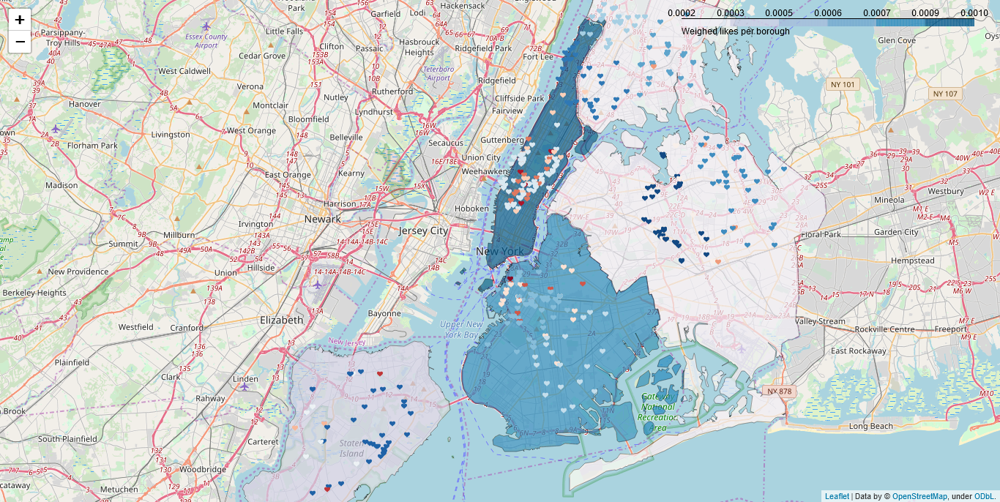

In [208]:
world_map = folium.Map(location=[NYC_latitude,NYC_longitude], zoom_start=11)

folium.Choropleth(
    geo_data=world_geo_data,
    data=BLW_df,
    columns=['Borough','Weighed Likes'],
    key_on='feature.properties.BoroName',
    fill_color='PuBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Weighed likes per borough'
).add_to(world_map)

folium.GeoJson(data=world_geo_data,
               name='NYC Boroughs',smooth_factor=1,
               style_function=lambda x: {'color':'black','colorOpacity':0.5,'fillColor':'transparent','weight':0.2},
               tooltip=folium.GeoJsonTooltip(fields=['BoroName','Likes weighed'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':2,'fillColor':'#6495ED','fillOpacity': 0.5}
              ).add_to(world_map)


for lat, lng, name, category, likes, idnum, cl in zip(venues['Latitude'], venues['Longitude'], venues['Name'], venues['Category'], venues['Likes'], venues['ID'], venues['Cluster label']):
    label = 'Name: {}, Cluster: {}, Likes: {}'.format(name, cl, likes)
    label = folium.Tooltip(label)
    icon = folium.Icon(color='white',colorOpacity=0.5,icon_color='black',icon='heart', prefix='fa', angle=0)
    folium.Marker(
        [lat, lng],
        tooltip=label,
        icon=fp.BeautifyIcon(
            icon='heart',
            #iconShape='circle',
            iconSize=[0,0],
            borderWidth=0,
            text_color=cluster_color_dict_correct[cl],
            #background_color=likes_palette[likes],
            inner_icon_style="font-size:8px;"
        )
    ).add_to(world_map)  



#display(world_map)

world_map_png_9 = world_map._to_png()

Image(world_map_png_9)

As can be readily seen, Manhattan still has the most fitness centers with a high weighed likes count.

<a href="#[9]" name="fn_[9]">Preliminary Summary</a>

In the following cells, an evaluation of the retrieved data will be performed. Also a first step to identify the optimum location will be performed.

In [209]:
URL = 'https://en.wikipedia.org/wiki/New_York_City#Boroughs'
URL_HTML = requests.get(URL)
URL_HTML_SOUP = bsoup(URL_HTML.text, 'html.parser')
NYC_TABLE_new = URL_HTML_SOUP.find_all('table')[4]
Borough_GDP = pd.DataFrame(pd.read_html(NYC_TABLE_new.prettify(), flavor='bs4')[0])
Borough_GDP.columns = ['Borough','County','Population','GDP','GDP per capita','Area (sq.m.)','Area (sq.km.)','Density (p.p.sq.mi.)','Density (p.p.sq.km.)']
Borough_GDP.drop([5,6,7],inplace=True)
Borough_GDP.drop(columns=['County','Population','GDP','Area (sq.m.)','Area (sq.km.)','Density (p.p.sq.mi.)','Density (p.p.sq.km.)'],inplace=True)
Borough_GDP.columns = ['Borough','GDP per capita']

In [210]:
Summary = pd.DataFrame()
Summary['Borough']=NYC_TABLE_PANDAS['Borough'].copy()
Summary['Venues per Population']=vpd['Venues per Population']
Summary = Summary.merge(BLW_df, on='Borough')
Summary = Summary.merge(Borough_GDP, on='Borough')
Summary = Summary.astype({'Venues per Population': np.float32, 'Weighed Likes': np.float32, 'GDP per capita': np.float32})

In [211]:
Summary

,Borough,Venues per Population,Weighed Likes,GDP per capita
0,Brooklyn,0.000031,0.000766,34600.0
1,Manhattan,0.000017,0.000984,360600.0
2,Queens,0.000042,0.000300,39600.0
3,Staten Island,0.000064,0.000427,30300.0
4,The Bronx,0.000022,0.000210,29200.0


We will normalize all values in this dataframe, give the venue per popluation values a negative sign, since this value should be minimized, and then sum over all rows:

In [212]:
Summary_norm = Summary.copy()
Summary_norm.drop('Borough',axis=1,inplace=True)

for i,row in Summary_norm.iterrows():
    Summary_norm.loc[i,'Venues per Population'] = - Summary_norm.loc[i,'Venues per Population']
    
Summary_norm.columns = ('Inverse Venues per Population', 'Weighed Likes', 'GDP per capita')

Summary_norm

,Inverse Venues per Population,Weighed Likes,GDP per capita
0,-0.000031,0.000766,34600.0
1,-0.000017,0.000984,360600.0
2,-0.000042,0.000300,39600.0
3,-0.000064,0.000427,30300.0
4,-0.000022,0.000210,29200.0


In [213]:
#PopDensSum = Summary_norm['Population Density'].sum()
#VenDensSum = Summary_norm['Venue Density'].sum()
#WLSum = Summary_norm['Weighed Likes'].sum()
#GDPSum = Summary_norm['GDP per capita'].sum()

VPPMax = Summary_norm['Inverse Venues per Population'].max()
WLMax = Summary_norm['Weighed Likes'].max()
GDPMax = Summary_norm['GDP per capita'].max()
VPPMin = Summary_norm['Inverse Venues per Population'].min()
WLMin = Summary_norm['Weighed Likes'].min()
GDPMin = Summary_norm['GDP per capita'].min()

In [214]:
Summary_fs = Summary_norm.copy()

for i,row in Summary_fs.iterrows():
    Summary_fs.loc[i,'Inverse Venues per Population'] = (Summary_fs.loc[i,'Inverse Venues per Population'] - VPPMin) / (VPPMax - VPPMin)
    Summary_fs.loc[i,'Weighed Likes'] = (Summary_fs.loc[i,'Weighed Likes'] - WLMin) / (WLMax - WLMin)
    Summary_fs.loc[i,'GDP per capita'] = (Summary_fs.loc[i,'GDP per capita'] - GDPMin) / (GDPMax - GDPMin)

In [215]:
Brooklyn_score = 0
Manhattan_score = 0
Queens_score = 0
Staten_score = 0
TheBronx_score = 0

for i,row in Summary_fs.iterrows():
    if i == 0:
        Brooklyn_score = row['Inverse Venues per Population'] + row['Weighed Likes'] + row['GDP per capita']
        Summary_fs.loc[i,'Score'] = Brooklyn_score
    elif i == 1:
        Manhattan_score = row['Inverse Venues per Population'] + row['Weighed Likes'] + row['GDP per capita']
        Summary_fs.loc[i,'Score'] = Manhattan_score
    elif i == 2:
        Queens_score = row['Inverse Venues per Population'] + row['Weighed Likes'] + row['GDP per capita']
        Summary_fs.loc[i,'Score'] = Queens_score
    elif i == 3:
        Staten_score = row['Inverse Venues per Population'] + row['Weighed Likes'] + row['GDP per capita']
        Summary_fs.loc[i,'Score'] = Staten_score
    elif i == 4:
        TheBronx_score = row['Inverse Venues per Population'] + row['Weighed Likes'] + row['GDP per capita']
        Summary_fs.loc[i,'Score'] = TheBronx_score
    else:
        pass

print('Results from feature scaling:')
print('Brooklyn: ' + str(Brooklyn_score))
print('Manhattan: ' + str(Manhattan_score))
print('Queens: ' + str(Queens_score))
print('Staten Island: ' + str(Staten_score))
print('The Bronx: ' + str(TheBronx_score))

Results from feature scaling:
Brooklyn: 1.4324242
Manhattan: 3.0
Queens: 0.60452086
Staten Island: 0.28433448
The Bronx: 0.8836608


In [216]:
Summary_fs

,Inverse Venues per Population,Weighed Likes,GDP per capita,Score
0,0.698003,0.718126,0.016295,1.432424
1,1.000000,1.000000,1.000000,3.000000
2,0.456288,0.116850,0.031382,0.604521
3,0.000000,0.281015,0.003319,0.284334
4,0.883661,0.000000,0.000000,0.883661


Based on this scaling, Manhattan is the most attractive location.

If the weighed likes are viewed as positive, Brooklyn is also a rather good location to invest in, since they have a rather low fitness centers per population value and since the people in Brooklyn seem to like fitness centers in general, since they have the second highest weighed likes value of all boroughs. However, the low GDP per capita could mean, that, compared with Manhattan, maybe also a lower ratio of people is inclined to go to fitness centers.

According to the scoring, suprisingly, Staten Island has the highest amount of venues per population, the rather low weighed likes value per venue, and the low GDP per capita are counter indicative of it being an prospective borough to invest in.

The Bronx has a rather low venues per popuation value, however it has the lowest amount of weighed likes per venue and the lowest GDP per capita.

Queens has the second lowest overall score, due its average venues per population, low weighed likes value and seemingly rather low GDP per capita. However, it has to be noted, that Manhattan seems to tower all other GDP per capita values, thus this feature maybe shouldn't be features scaled, but rather standardized.

Generally, Manhattan seems to be the best choice for opening a fitness center, however, Brooklyn should possibly considered aswell, based on this model.

Let's repeat the anaylsis one last time, however, this time, the likes count will be viewed as negative, since a high weighed likes count in a way is indicative of a saturated market. Remember that this weighed likes count is normalized per venue and population density:

In [217]:
Summary_norm = Summary.copy()
Summary_norm.drop('Borough',axis=1,inplace=True)

for i,row in Summary_norm.iterrows():
    Summary_norm.loc[i,'Venues per Population'] = - Summary_norm.loc[i,'Venues per Population']
    Summary_norm.loc[i,'Weighed Likes'] = - Summary_norm.loc[i,'Weighed Likes']
    
Summary_norm.columns = ('Inverse Venues per Population', 'Inverse Weighed Likes', 'GDP per capita')

    
VPPMax = Summary_norm['Inverse Venues per Population'].max()
WLMax = Summary_norm['Inverse Weighed Likes'].max()
GDPMax = Summary_norm['GDP per capita'].max()
VPPMin = Summary_norm['Inverse Venues per Population'].min()
WLMin = Summary_norm['Inverse Weighed Likes'].min()
GDPMin = Summary_norm['GDP per capita'].min()

Summary_fs_inv = Summary_norm.copy()
#Summary_fs_inv.drop(['Venue Density','Weighed Likes'],axis=1,inplace=True)
#Summary_fs_inv = Summary_fs_inv.reindex(['Population Density', 'Inverse Venue Density', 'Inverse Weighed Likes', 'GDP per capita'], axis=1)    

for i,row in Summary_fs_inv.iterrows():
    Summary_fs_inv.loc[i,'Inverse Venues per Population'] = (Summary_fs_inv.loc[i,'Inverse Venues per Population'] - VPPMin) / (VPPMax - VPPMin)
    Summary_fs_inv.loc[i,'Inverse Weighed Likes'] = (Summary_fs_inv.loc[i,'Inverse Weighed Likes'] - WLMin) / (WLMax - WLMin)
    Summary_fs_inv.loc[i,'GDP per capita'] = (Summary_fs_inv.loc[i,'GDP per capita'] - GDPMin) / (GDPMax - GDPMin)
    
Brooklyn_score = 0
Manhattan_score = 0
Queens_score = 0
Staten_score = 0
TheBronx_score = 0

for i,row in Summary_fs_inv.iterrows():
    if i == 0:
        Brooklyn_score = row['Inverse Venues per Population'] + row['Inverse Weighed Likes'] + row['GDP per capita']
        Summary_fs_inv.loc[i,'Score'] = Brooklyn_score
    elif i == 1:
        Manhattan_score = row['Inverse Venues per Population'] + row['Inverse Weighed Likes'] + row['GDP per capita']
        Summary_fs_inv.loc[i,'Score'] = Manhattan_score
    elif i == 2:
        Queens_score = row['Inverse Venues per Population'] + row['Inverse Weighed Likes'] + row['GDP per capita']
        Summary_fs_inv.loc[i,'Score'] = Queens_score
    elif i == 3:
        Staten_score = row['Inverse Venues per Population'] + row['Inverse Weighed Likes'] + row['GDP per capita']
        Summary_fs_inv.loc[i,'Score'] = Staten_score
    elif i == 4:
        TheBronx_score = row['Inverse Venues per Population'] + row['Inverse Weighed Likes'] + row['GDP per capita']
        Summary_fs_inv.loc[i,'Score'] = TheBronx_score
    else:
        pass

print('Results from feature scaling:')
print('Brooklyn: ' + str(Brooklyn_score))
print('Manhattan: ' + str(Manhattan_score))
print('Queens: ' + str(Queens_score))
print('Staten Island: ' + str(Staten_score))
print('The Bronx: ' + str(TheBronx_score))

Results from feature scaling:
Brooklyn: 0.9961717
Manhattan: 2.0
Queens: 1.37082
Staten Island: 0.72230405
The Bronx: 1.8836608


In [218]:
Summary_fs_inv

,Inverse Venues per Population,Inverse Weighed Likes,GDP per capita,Score
0,0.698003,0.281874,0.016295,0.996172
1,1.000000,0.000000,1.000000,2.000000
2,0.456288,0.883150,0.031382,1.370820
3,0.000000,0.718985,0.003319,0.722304
4,0.883661,1.000000,0.000000,1.883661


Even though losing the advantage of its high weighed likes count, Manhattan still scores the best, after The Bronx.

The Bronx takes the second place, however, an investigation into the reasons why customers in The Bronx barely give any likes should be performed, possibly there is a correlation with the GDP per capita, however the data presented above only suggests such a correlation for the extreme cases of Manhattan and The Bronx.

However, an interesting find is, that due to its average venues per population count, and due to its low weighed likes value, which can be indicative of a desire for a non-saturated marked, and due to its second highest GDP per capita, Queens now scores rather well.

Overall, while a low weighed likes count can be indicative of a non-saturated market, it can also be a hint, that customers in those areas are either hard to satisfy, or don't care much about rating a location.

Depending on which reasons applies to the Bronx, should also be considered as a location, but since Manhattan and Queens hold their respective positions rather well, they should be the first boroughs to consider.